In [1]:
!pip install jupyterthemes

In [2]:
!jt -l

Available Themes: 
   chesterish
   grade3
   gruvboxd
   gruvboxl
   monokai
   oceans16
   onedork
   solarizedd
   solarizedl


In [3]:
!jt -monokai

In [4]:
from jupyterthemes import get_themes
from jupyterthemes.stylefx import set_nb_theme

In [5]:
set_nb_theme('monokai')

In [6]:
print("\n")

# Data Overview

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
import networkx as nx

In [8]:
philosophy = pd.read_csv("Philosophy.csv", delimiter = ";", encoding = "ISO-8859-1")
philosophy

,A,B,Weight,Unnamed: 3
0,Ferdinand_de_Saussure,Jacques_Lacan,1,NaN
1,Georg_Wilhelm_Friedrich_Hegel,Jacques_Lacan,1,NaN
2,Mufti_Muhammad_Shafi,Mufti,1,NaN
3,Terence_McKenna,Robert_Anton_Wilson,1,NaN
4,Aristotle,Alexander_the_Great,1,NaN
...,...,...,...,...
2332,R._Radhakrishnan,Xu_Ben,1,NaN
2333,Jakob_Schegk,Protestant_Scholasticism,1,NaN
2334,Muhammad_Ilyas_Qadri,Muhammad_Akmal_Qadri,1,NaN
2335,Peter_G._Ossorio,Mary_McDermott_Shideler,1,NaN


In [9]:
philosophy.head(50)

,A,B,Weight,Unnamed: 3
0,Ferdinand_de_Saussure,Jacques_Lacan,1,NaN
1,Georg_Wilhelm_Friedrich_Hegel,Jacques_Lacan,1,NaN
2,Mufti_Muhammad_Shafi,Mufti,1,NaN
3,Terence_McKenna,Robert_Anton_Wilson,1,NaN
4,Aristotle,Alexander_the_Great,1,NaN
5,Emerich_de_Vattel,Benjamin_Franklin,1,NaN
6,Pierre-Joseph_Proudhon,Benjamin_Tucker,1,NaN
7,Josiah_Warren,Benjamin_Tucker,1,NaN
8,Max_Stirner,Benjamin_Tucker,1,NaN
9,Mary_Baker_Eddy,Christianity,1,NaN


In [10]:
# since Unnamed: 3 has NAN values, we drop the column

In [11]:
philosophy.drop("Unnamed: 3", axis = 1, inplace = True)
# axis = 1 means we drop the column and we use inplace = True to replace the philosophy with the new one (Dataframe with column Unnamed: 3 already dropped)

In [12]:
philosophy.head(10)

,A,B,Weight
0,Ferdinand_de_Saussure,Jacques_Lacan,1
1,Georg_Wilhelm_Friedrich_Hegel,Jacques_Lacan,1
2,Mufti_Muhammad_Shafi,Mufti,1
3,Terence_McKenna,Robert_Anton_Wilson,1
4,Aristotle,Alexander_the_Great,1
5,Emerich_de_Vattel,Benjamin_Franklin,1
6,Pierre-Joseph_Proudhon,Benjamin_Tucker,1
7,Josiah_Warren,Benjamin_Tucker,1
8,Max_Stirner,Benjamin_Tucker,1
9,Mary_Baker_Eddy,Christianity,1


In [13]:
philosophy.isnull().sum() # to check if there are other NAN values

A         0
B         0
Weight    0
dtype: int64

In [14]:
# since there's no other NAN values, we don't need to do data cleaning further

In [15]:
# I rename column A and B so that this program reader will know that column A means Philosopher 1 and column B means Philosopher 2. Later on, I'll make a Philosopher Network from Philosopher 1 to Philosopher 2.

In [16]:
philosophy.rename(columns = {"A": "Philosopher 1", "B": "Philosopher 2"}, inplace = True)

In [17]:
philosophy.head(10)

,Philosopher 1,Philosopher 2,Weight
0,Ferdinand_de_Saussure,Jacques_Lacan,1
1,Georg_Wilhelm_Friedrich_Hegel,Jacques_Lacan,1
2,Mufti_Muhammad_Shafi,Mufti,1
3,Terence_McKenna,Robert_Anton_Wilson,1
4,Aristotle,Alexander_the_Great,1
5,Emerich_de_Vattel,Benjamin_Franklin,1
6,Pierre-Joseph_Proudhon,Benjamin_Tucker,1
7,Josiah_Warren,Benjamin_Tucker,1
8,Max_Stirner,Benjamin_Tucker,1
9,Mary_Baker_Eddy,Christianity,1


In [18]:
print("\n")

# Network Analysis

In [19]:
philosopher_graph = nx.from_pandas_edgelist(philosophy, source = "Philosopher 1", target = "Philosopher 2", edge_attr = "Weight")
# graph = nx.Graph()

In [20]:
# for index, row in philosophy.iterrows():
    # graph.add_edge(row[0], row[1], weight = row[2])
# graph.is_weighted()

In [21]:
graph = nx.Graph(philosopher_graph)

In [82]:
# for index, row in philosophy.iterrows():
    # graph.add_weighted_edges_from(philosophy["Weight"])
nx.is_weighted(graph) # check whether the network graph is weighted or not

False

In [23]:
for elements in list(nx.connected_components(graph)):
    if (len(elements) < 1000):
        for nodes in elements:
            graph.remove_node(nodes)

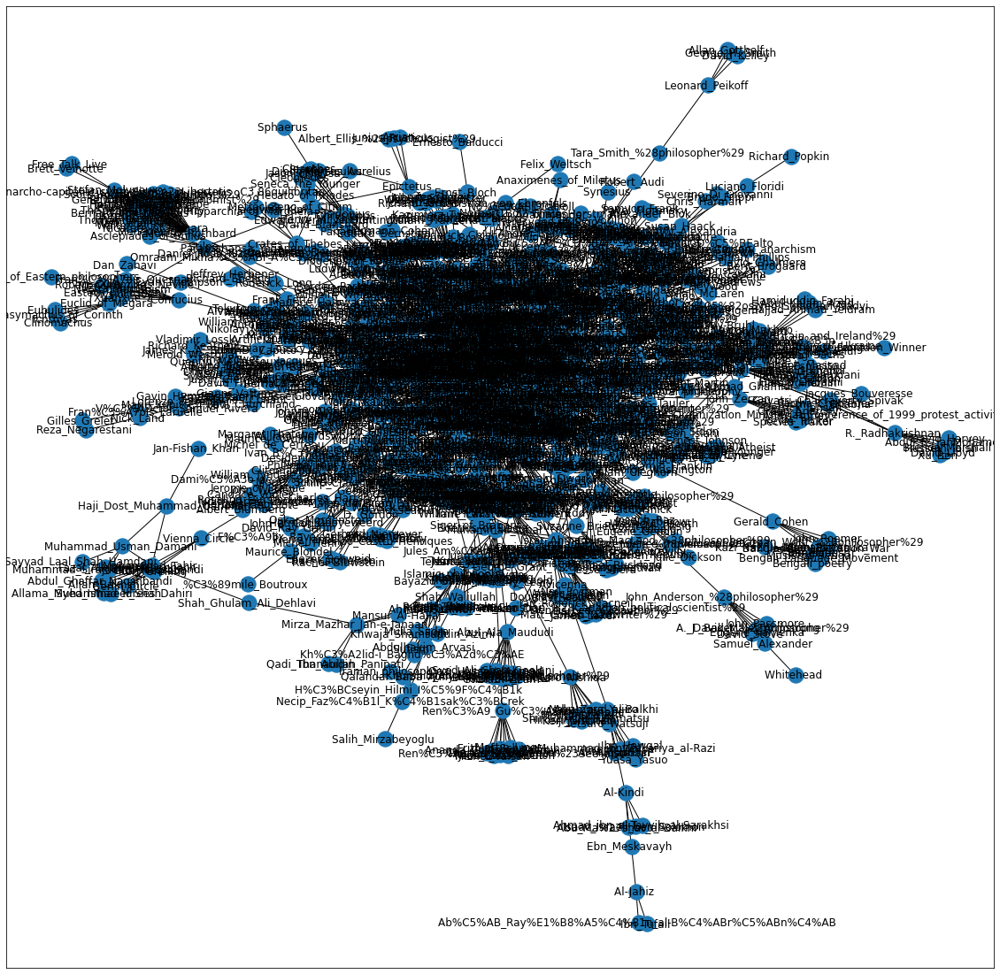

In [24]:
plt.figure(figsize = (20, 20))
pos = nx.spring_layout(graph)
philosopher_network = nx.draw_networkx(graph, pos, with_labels = True)
plt.show()

In [25]:
nx.diameter(graph)

13

In [26]:
# the graph diameter output is 13 means the graph is connected.

In [27]:
nx.average_shortest_path_length(graph)

5.063452378885474

In [28]:
print("\n")

## Network Robustness

In [29]:
nx.node_connectivity(graph)

1

In [30]:
nx.algebraic_connectivity(graph)

0.022911092719139867

In [31]:
# From the results above,
# a. the output of node connectivity (1) means that the graph will be disconnected after 1 node is removed, which is alright since the rest of graph is still connected. Also, the size of removed node is small because if the size is big, then there's a problem in the network structure
# b. the output of Algebraic Connectivity (0.0230) is smaller than the output of node connectivity (1), which means the graph is strongly connected and the Philosopher Network is robust.

In [32]:
print("\n\n")

### Most Influential - Degree Centrality

In [33]:
most_influential_philosopher = nx.degree_centrality(graph)
count = 0

for index in sorted(most_influential_philosopher, key = most_influential_philosopher.get, reverse = True): # we use reverse = True to print the output in descending order
    count = count + 1
    if count == 10:
        break
    print(index, "{:.4f}".format(most_influential_philosopher[index]))

Georg_Wilhelm_Friedrich_Hegel  0.0510
Arthur_Schopenhauer  0.0426
Friedrich_Nietzsche  0.0396
Immanuel_Kant  0.0365
Karl_Marx  0.0327
S%C3%B8ren_Kierkegaard  0.0289
David_Hume  0.0289
Edmund_Husserl  0.0282
Baruch_Spinoza  0.0274


In [34]:
# I make a list for both the key (which is the index from the output above) and the degree centrality score so that it will be easier to make a dataframe for the Top 10 Most Influential Philosopher 
philosopher = []
degree_centrality = []

for key, score in most_influential_philosopher.items():
    philosopher.append(key)
    degree_centrality.append(score)

In [35]:
# I make a dataframe for the Top 10 Most Influential Philosopher in order to make me easier to draw the barplot from the outputs
most_influential_philosopher = pd.DataFrame()
most_influential_philosopher["Philosopher"] = philosopher
most_influential_philosopher["Degree Centrality"] = degree_centrality
most_influential_philosopher = most_influential_philosopher.sort_values(by = "Degree Centrality", ascending = False)

In [36]:
most_influential_philosopher.head(10)

,Philosopher,Degree Centrality
2,Georg_Wilhelm_Friedrich_Hegel,0.050989
32,Arthur_Schopenhauer,0.042618
27,Friedrich_Nietzsche,0.039574
41,Immanuel_Kant,0.036530
74,Karl_Marx,0.032725
95,David_Hume,0.028919
69,S%C3%B8ren_Kierkegaard,0.028919
72,Edmund_Husserl,0.028158
38,Baruch_Spinoza,0.027397
209,Noam_Chomsky,0.026636


Text(0.5, 1.0, 'Top 10 Most Influential Philosophers in Philosopher Social Network')

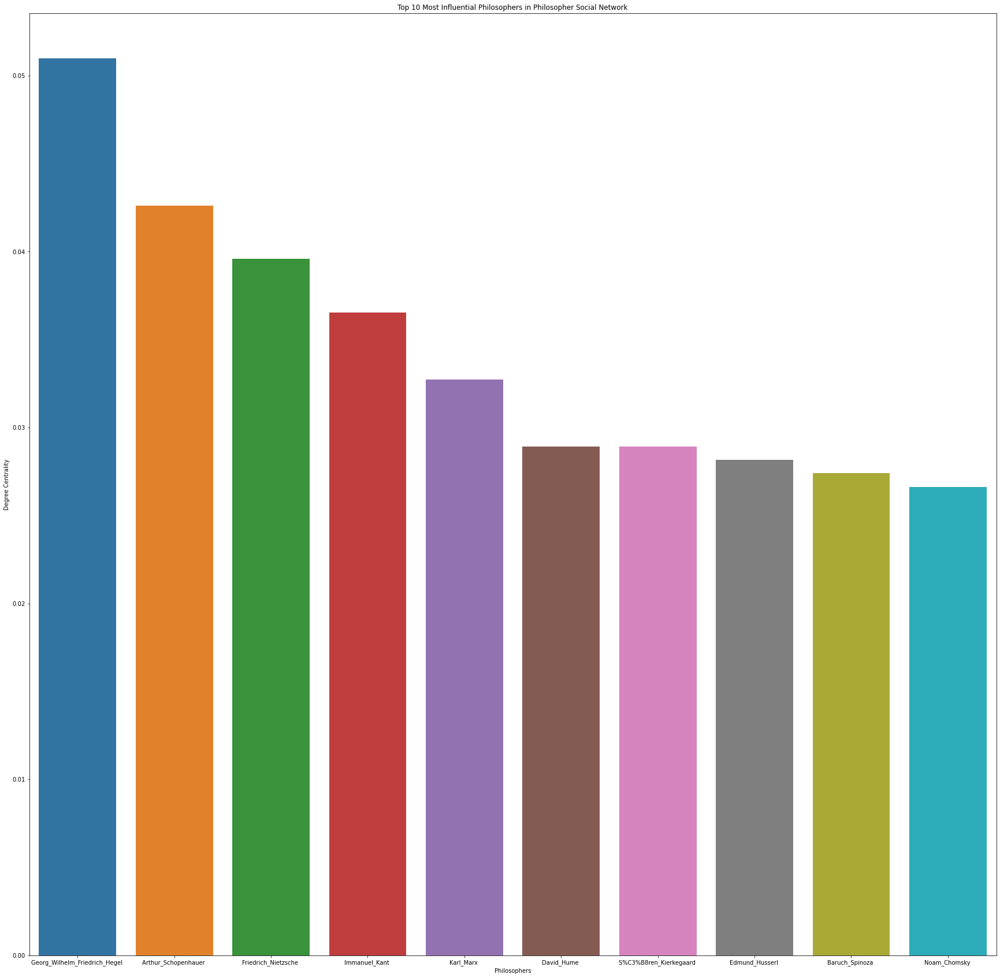

In [52]:
# visualize the Top 10 Most Influential Philosopher with barplot
plt.figure(figsize = (30, 30))
sb.barplot(x = "Philosopher", y = "Degree Centrality", data = most_influential_philosopher[:10])
plt.xlabel("Philosophers")
plt.ylabel("Degree Centrality")
plt.title("Top 10 Most Influential Philosophers in Philosopher Social Network")

from the barplot above, we can see that Georg Wilhelm Friedrich Hegel is the most influential philosopher 

In [38]:
print("\n")

### Most Important Connection - Eigenvector Centrality

In [39]:
most_important_connection = nx.eigenvector_centrality(graph)

In [43]:
count = 0

for index in sorted(most_important_connection, key = most_important_connection.get, reverse = True):
    count = count + 1
    if count == 10:
        break
    print(index, "{:.4f}".format(most_important_connection[index]))

Georg_Wilhelm_Friedrich_Hegel  0.3293
Immanuel_Kant  0.3038
Friedrich_Nietzsche  0.2889
Baruch_Spinoza  0.2170
Arthur_Schopenhauer  0.2018
Jean-Jacques_Rousseau  0.1747
Karl_Marx  0.1662
Jean-Paul_Sartre  0.1651
S%C3%B8ren_Kierkegaard  0.1601


In [45]:
philosophers = []
eigenvector_centrality = []

for key, score in most_important_connection.items():
    philosophers.append(key)
    eigenvector_centrality.append(score)

In [46]:
most_important_connection = pd.DataFrame()
most_important_connection["Philosopher"] = philosophers
most_important_connection["Eigenvector Centrality"] = eigenvector_centrality
most_important_connection = most_important_connection.sort_values(by = "Eigenvector Centrality", ascending = False)

In [47]:
most_important_connection.head(10)

,Philosopher,Eigenvector Centrality
2,Georg_Wilhelm_Friedrich_Hegel,0.329285
41,Immanuel_Kant,0.303787
27,Friedrich_Nietzsche,0.288922
38,Baruch_Spinoza,0.217015
32,Arthur_Schopenhauer,0.201831
30,Jean-Jacques_Rousseau,0.174694
74,Karl_Marx,0.166170
70,Jean-Paul_Sartre,0.165133
69,S%C3%B8ren_Kierkegaard,0.160141
108,Martin_Heidegger,0.151637


Text(0.5, 1.0, 'Top 10 Most Important Connection in Philosopher Social Network')

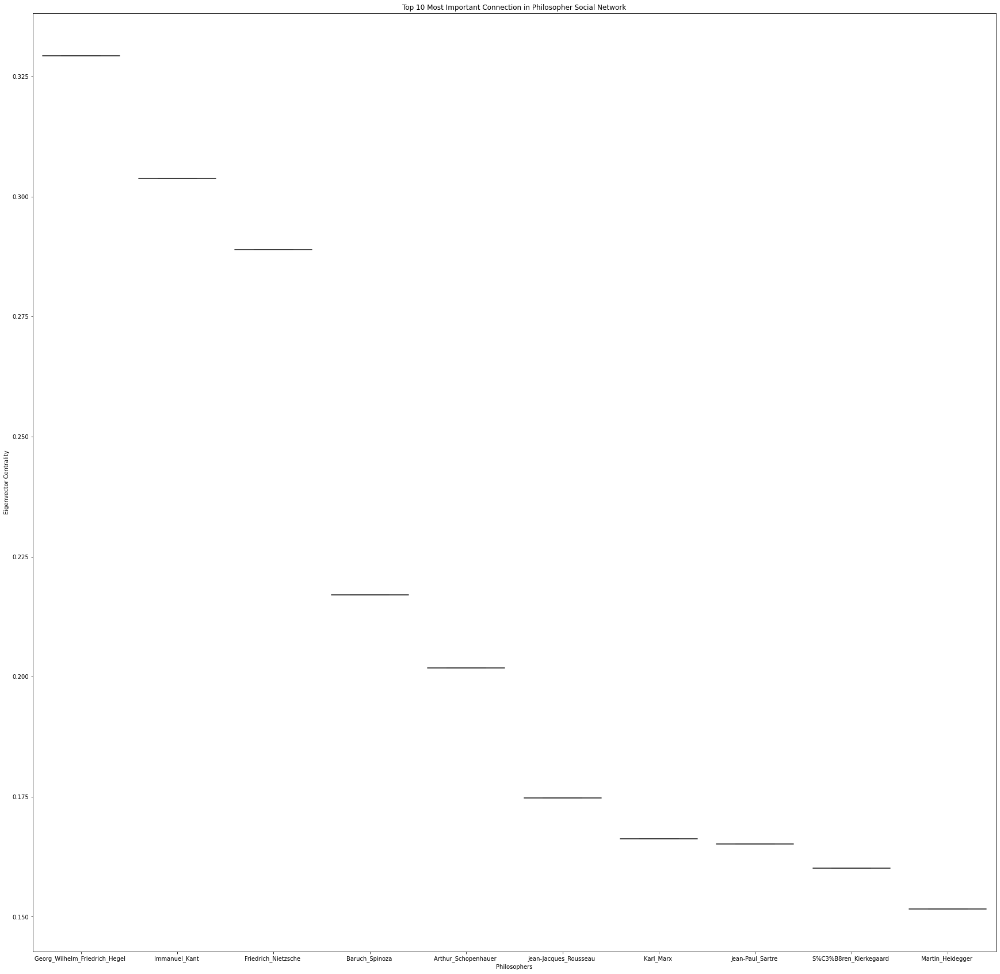

In [53]:
plt.figure(figsize = (30, 30))
sb.boxplot(x = "Philosopher", y = "Eigenvector Centrality", data = most_important_connection[:10])
plt.xlabel("Philosophers")
plt.ylabel("Eigenvector Centrality")
plt.title("Top 10 Most Important Connection in Philosopher Social Network")

from the relplot above, we can see that Georg Wilhelm Friedrich Hegel is the most influential philosopher 

In [51]:
print("\n")

### The Best Connector - Betweenness Centrality

In [54]:
best_connector = nx.betweenness_centrality(graph)
count = 0

for index in sorted(best_connector, key = best_connector.get, reverse = True):
    count = count + 1
    if count == 10:
        break
    print(index, "{:.4f}".format(best_connector[index]))

Immanuel_Kant  0.1839
Friedrich_Nietzsche  0.1610
Georg_Wilhelm_Friedrich_Hegel  0.1318
Arthur_Schopenhauer  0.1027
Plato  0.0891
Henri_Bergson  0.0838
Karl_Marx  0.0819
Muhammad_Iqbal  0.0782
David_Hume  0.0740


In [56]:
philosopherss = []
betweenness_centrality = []

for key, score in best_connector.items():
    philosopherss.append(key)
    betweenness_centrality.append(score)

In [57]:
best_connector = pd.DataFrame()
best_connector["Philosopher"] = philosopherss
best_connector["Betweenness Centrality"] = betweenness_centrality
best_connector = best_connector.sort_values(by = "Betweenness Centrality", ascending = False)

In [58]:
best_connector.head(10)

,Philosopher,Betweenness Centrality
41,Immanuel_Kant,0.183887
27,Friedrich_Nietzsche,0.161019
2,Georg_Wilhelm_Friedrich_Hegel,0.131834
32,Arthur_Schopenhauer,0.102682
28,Plato,0.089087
137,Henri_Bergson,0.083777
74,Karl_Marx,0.081866
170,Muhammad_Iqbal,0.078166
95,David_Hume,0.073997
209,Noam_Chomsky,0.071062


Text(0.5, 1.0, 'Top 10 the Best Connector Philosopher in the Philosopher Social Network')

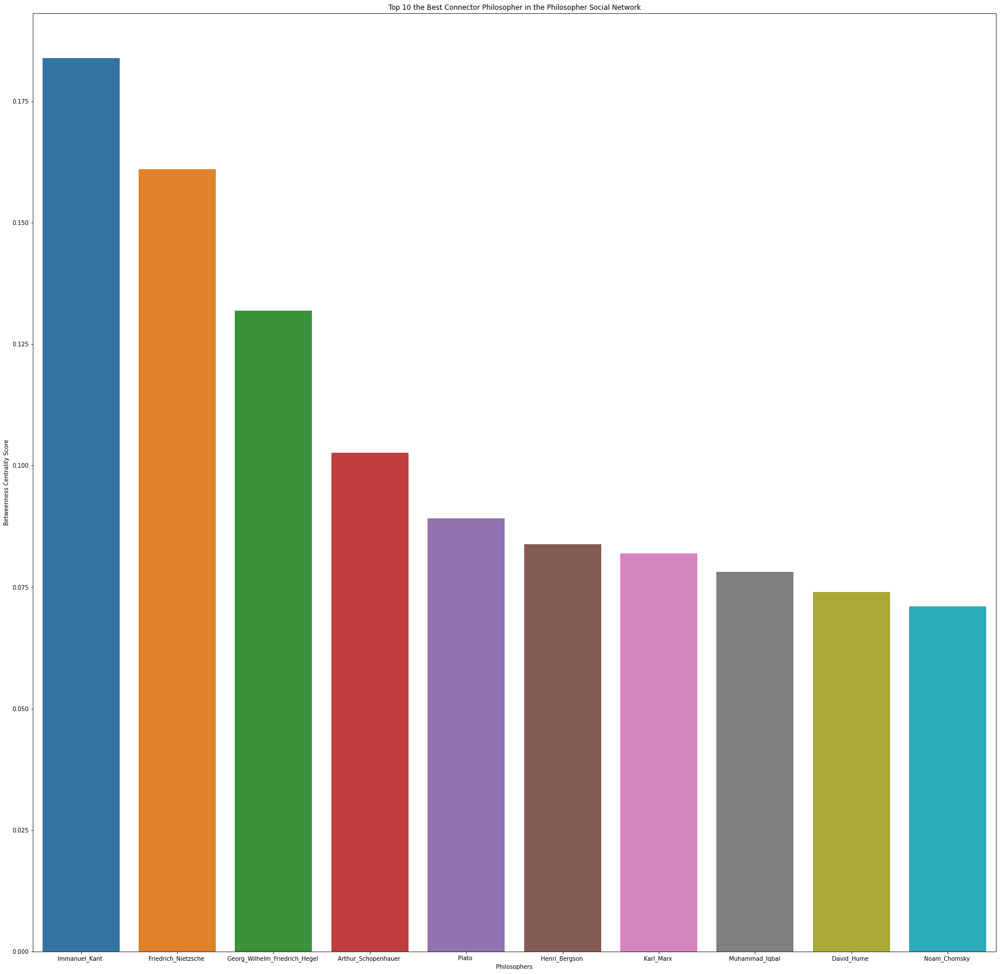

In [59]:
plt.figure(figsize = (30, 30))
sb.barplot(x = "Philosopher", y = "Betweenness Centrality", data = best_connector[:10])
plt.xlabel("Philosophers")
plt.ylabel("Betweenness Centrality Score")
plt.title("Top 10 the Best Connector Philosopher in the Philosopher Social Network")

from the barplot above, Immanuel Kant is the best connector philosopher in the Philosopher Social Network

In [61]:
print("\n\n")

# Building A Subgroup

### Method 1

In [65]:
nx.nodes(graph)

NodeView(('Ferdinand_de_Saussure\xa0', 'Jacques_Lacan\xa0', 'Georg_Wilhelm_Friedrich_Hegel\xa0', 'Terence_McKenna\xa0', 'Robert_Anton_Wilson\xa0', 'Aristotle\xa0', 'Alexander_the_Great\xa0', 'Emerich_de_Vattel\xa0', 'Benjamin_Franklin\xa0', 'Pierre-Joseph_Proudhon\xa0', 'Benjamin_Tucker\xa0', 'Josiah_Warren\xa0', 'Max_Stirner\xa0', 'Mary_Baker_Eddy\xa0', 'Christianity\xa0', 'George_Boole\xa0', 'Claude_Shannon\xa0', 'Joseph_de_Maistre\xa0', 'Charles_Baudelaire\xa0', 'Emanuel_Swedenborg\xa0', 'Boethius\xa0', 'Dante_Alighieri\xa0', 'Otto_Weininger\xa0', 'Elias_Canetti\xa0', 'Giovanni_Pico_della_Mirandola\xa0', 'Desiderius_Erasmus\xa0', 'John_Colet\xa0', 'Friedrich_Nietzsche\xa0', 'Plato\xa0', 'African_Spir\xa0', 'Jean-Jacques_Rousseau\xa0', 'Michel_de_Montaigne\xa0', 'Arthur_Schopenhauer\xa0', 'Empedocles\xa0', 'Heraclitus\xa0', 'Parmenides\xa0', 'Protagoras\xa0', 'Friedrich_Albert_Lange\xa0', 'Baruch_Spinoza\xa0', 'Epicurus\xa0', 'Gottfried_Leibniz\xa0', 'Immanuel_Kant\xa0', 'Niccol%C3%B

In [67]:
georg_network = nx.bfs_tree(graph, "Georg_Wilhelm_Friedrich_Hegel\xa0")
# to visualize the subgraph / subnetwork of Georg Wilhelm Friedrich Hegel using Breadth-First-Search Method

In [68]:
immanuel_kant_network = nx.bfs_tree(graph, "Immanuel_Kant\xa0")
# to visualize the subgraph / subnetwork of Immanuel Kant using Breadth-First-Search Method

In [69]:
nietzsche_network = nx.bfs_tree(graph, "Friedrich_Nietzsche\xa0")
# to visualize the subgraph / subnetwork of Friedrich Nietzsche using Breadth-First-Search Method

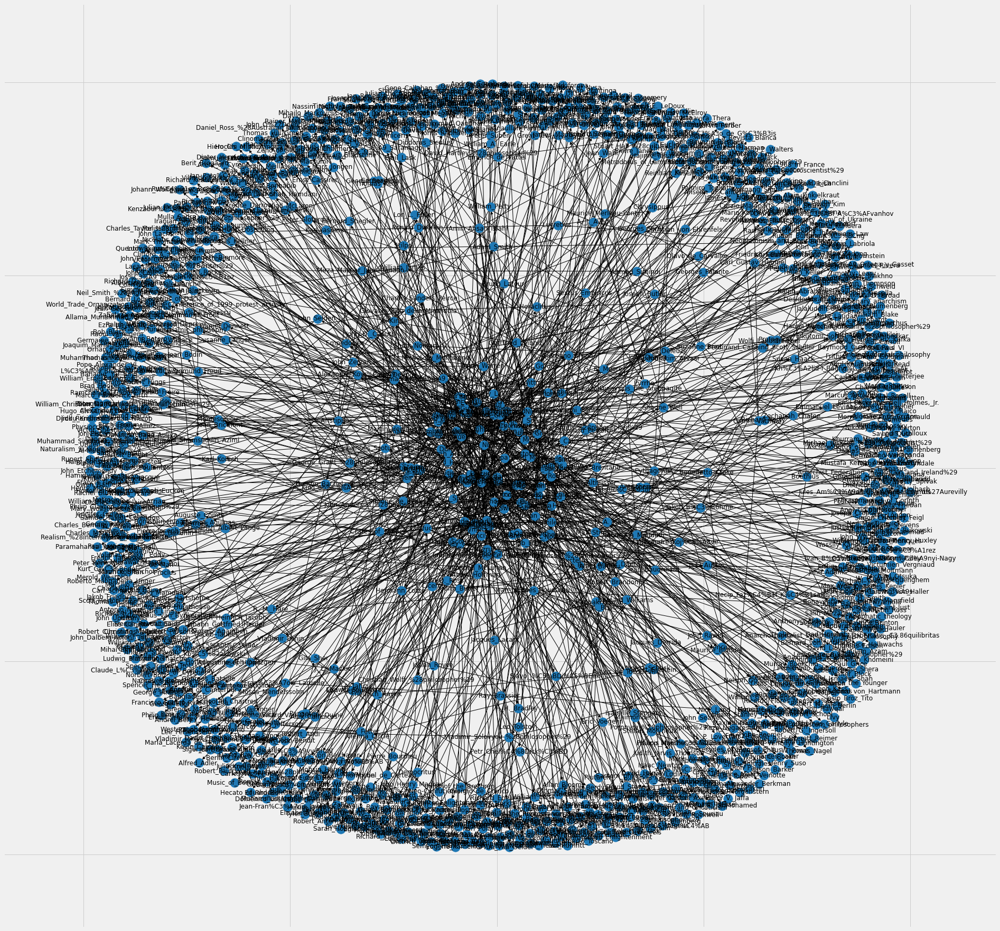

In [79]:
plt.figure(figsize = (30, 30))
plt.style.use("fivethirtyeight")
pos = nx.spring_layout(georg_network)
nx.draw_networkx(georg_network, pos, with_labels = True)

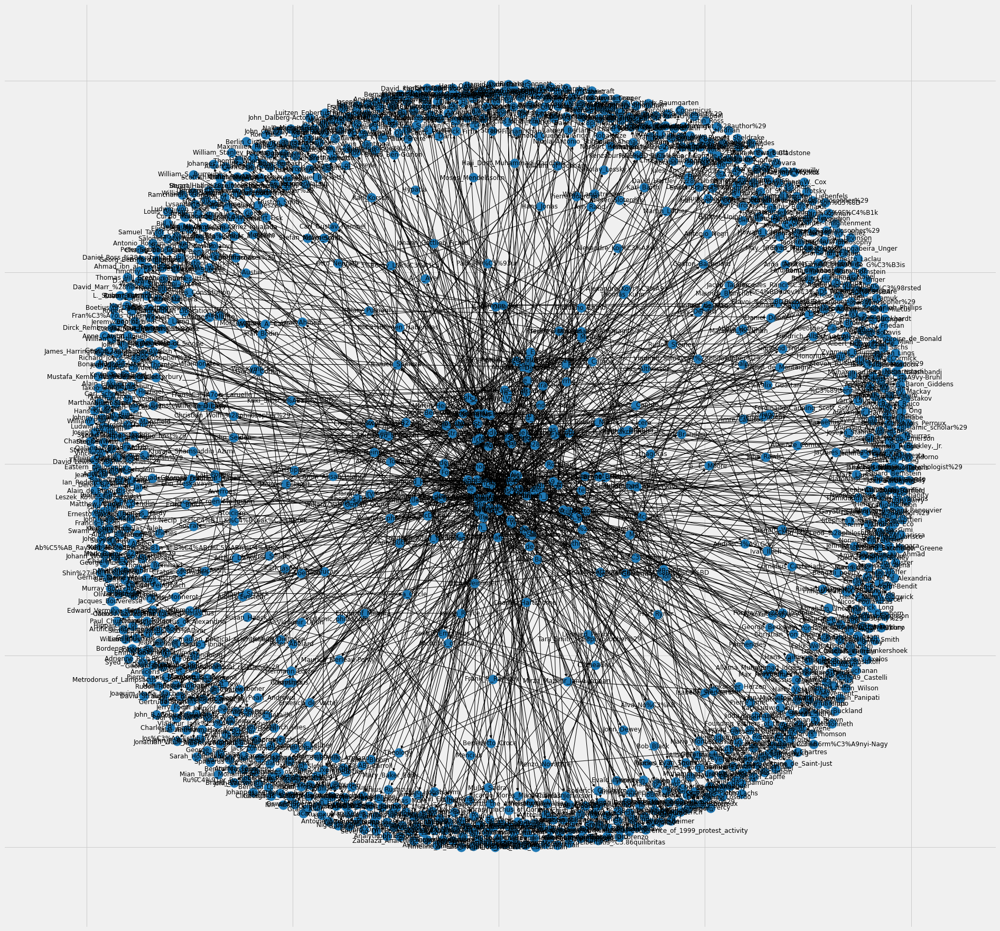

In [80]:
plt.figure(figsize = (30, 30))
plt.style.use("fivethirtyeight")
pos = nx.spring_layout(immanuel_kant_network)
nx.draw_networkx(immanuel_kant_network, pos, with_labels = True)

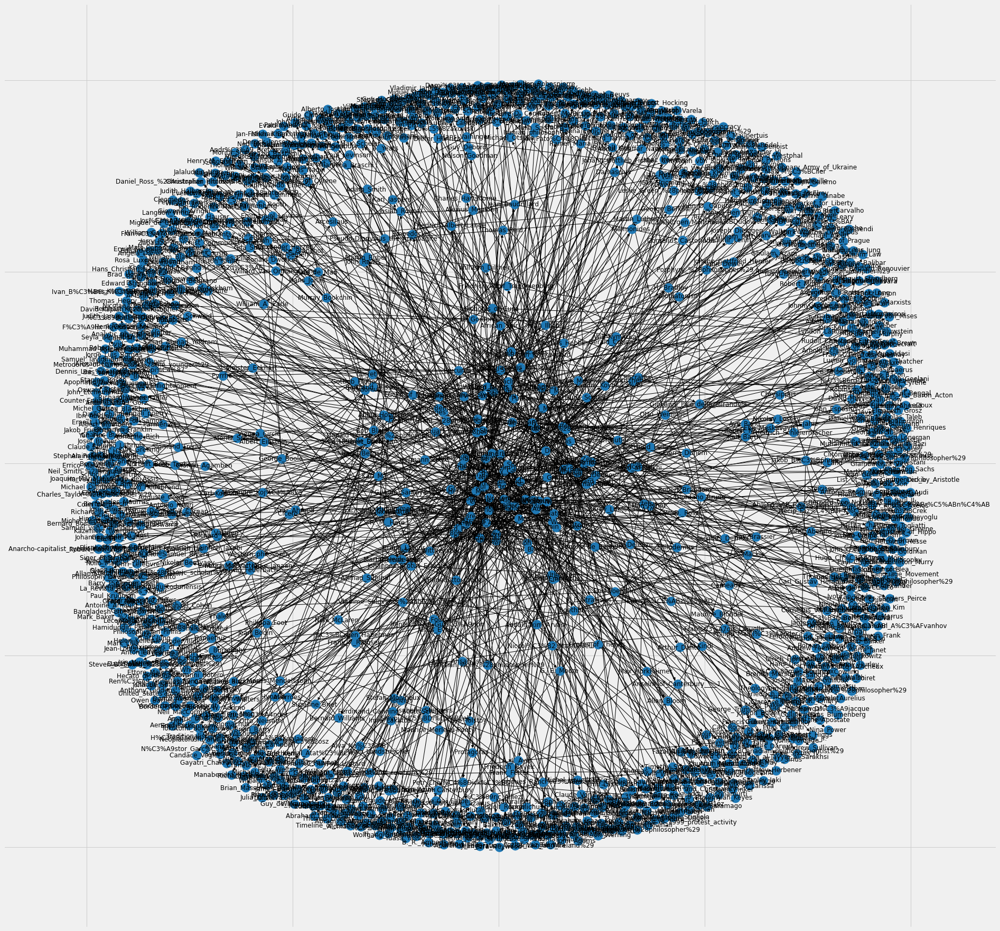

In [81]:
plt.figure(figsize = (30, 30))
plt.style.use("fivethirtyeight")
pos = nx.spring_layout(nietzsche_network)
nx.draw_networkx(nietzsche_network, pos, with_labels = True)

In [73]:
print("\n")

### Method 2

In [74]:
nx.node_connected_component(graph, "Georg_Wilhelm_Friedrich_Hegel\xa0")
# to show the list of subnetwork of Georg Wilhelm Friedrich Hegel

{'Jos%C3%A9_Esteban_Mu%C3%B1oz\xa0',
 'Eric_Voegelin\xa0',
 'Rudolf_Carnap\xa0',
 'Langdon_Winner\xa0',
 'S%C3%B8ren_Kierkegaard\xa0',
 'Gareth_Evans_%28philosopher%29\xa0',
 'Peter_Deunov\xa0',
 'Alexandre_Koyr%C3%A9\xa0',
 'Helen_Keller\xa0',
 'Marco_Pallis\xa0',
 'Praxis_School\xa0',
 'Cornelius_van_Bynkershoek\xa0',
 'Epicureanism\xa0',
 'Michael_Hardt\xa0',
 'Metrodorus_of_Lampsacus_%28the_younger%29\xa0',
 'Louis_Althusser\xa0',
 'David_Lloyd\xa0',
 'Arcesilaus\xa0',
 'Abdul_R._JanMohamed\xa0',
 'Alexander_Hamilton\xa0',
 'Pierre-Joseph_Proudhon\xa0',
 'Maurice_Halbwachs\xa0',
 'Ray_C._Dougherty\xa0',
 'Lauren_Berlant\xa0',
 'Richard_Tieszen\xa0',
 'Aenesidemus\xa0',
 'Friedrich_Albert_Lange\xa0',
 'Gilbert_Simondon\xa0',
 'Jean_Grave\xa0',
 'Iamblichus\xa0',
 'Pierre_Gassendi\xa0',
 'Herman_Dooyeweerd\xa0',
 'F._H._Bradley\xa0',
 'Metrocles\xa0',
 'Proclus\xa0',
 'Alan_Keyes\xa0',
 'Robert_Fisk\xa0',
 'Zygmunt_Bauman\xa0',
 'Physiocracy\xa0',
 'Gad_Horowitz\xa0',
 'William_Paley

In [75]:
nx.node_connected_component(graph, "Immanuel_Kant\xa0")
# to show the list of subnetwork of Immanuel Kant

{'Jos%C3%A9_Esteban_Mu%C3%B1oz\xa0',
 'Eric_Voegelin\xa0',
 'Rudolf_Carnap\xa0',
 'Langdon_Winner\xa0',
 'S%C3%B8ren_Kierkegaard\xa0',
 'Gareth_Evans_%28philosopher%29\xa0',
 'Peter_Deunov\xa0',
 'Alexandre_Koyr%C3%A9\xa0',
 'Helen_Keller\xa0',
 'Marco_Pallis\xa0',
 'Praxis_School\xa0',
 'Cornelius_van_Bynkershoek\xa0',
 'Epicureanism\xa0',
 'Metrodorus_of_Lampsacus_%28the_younger%29\xa0',
 'Michael_Hardt\xa0',
 'Louis_Althusser\xa0',
 'David_Lloyd\xa0',
 'Arcesilaus\xa0',
 'Abdul_R._JanMohamed\xa0',
 'Alexander_Hamilton\xa0',
 'Pierre-Joseph_Proudhon\xa0',
 'Maurice_Halbwachs\xa0',
 'Ray_C._Dougherty\xa0',
 'Lauren_Berlant\xa0',
 'Richard_Tieszen\xa0',
 'Aenesidemus\xa0',
 'Friedrich_Albert_Lange\xa0',
 'Gilbert_Simondon\xa0',
 'Jean_Grave\xa0',
 'Pierre_Gassendi\xa0',
 'Iamblichus\xa0',
 'Herman_Dooyeweerd\xa0',
 'F._H._Bradley\xa0',
 'Metrocles\xa0',
 'Proclus\xa0',
 'Alan_Keyes\xa0',
 'Robert_Fisk\xa0',
 'Zygmunt_Bauman\xa0',
 'Physiocracy\xa0',
 'Gad_Horowitz\xa0',
 'William_Paley

In [76]:
nx.node_connected_component(graph, "Friedrich_Nietzsche\xa0")
# to show the list of subnetwork of Friedrich Nietzsche

{'Jos%C3%A9_Esteban_Mu%C3%B1oz\xa0',
 'Eric_Voegelin\xa0',
 'Rudolf_Carnap\xa0',
 'Langdon_Winner\xa0',
 'S%C3%B8ren_Kierkegaard\xa0',
 'Gareth_Evans_%28philosopher%29\xa0',
 'Peter_Deunov\xa0',
 'Alexandre_Koyr%C3%A9\xa0',
 'Helen_Keller\xa0',
 'Marco_Pallis\xa0',
 'Praxis_School\xa0',
 'Cornelius_van_Bynkershoek\xa0',
 'Epicureanism\xa0',
 'Metrodorus_of_Lampsacus_%28the_younger%29\xa0',
 'Michael_Hardt\xa0',
 'Louis_Althusser\xa0',
 'David_Lloyd\xa0',
 'Arcesilaus\xa0',
 'Abdul_R._JanMohamed\xa0',
 'Alexander_Hamilton\xa0',
 'Pierre-Joseph_Proudhon\xa0',
 'Maurice_Halbwachs\xa0',
 'Ray_C._Dougherty\xa0',
 'Lauren_Berlant\xa0',
 'Richard_Tieszen\xa0',
 'Aenesidemus\xa0',
 'Friedrich_Albert_Lange\xa0',
 'Gilbert_Simondon\xa0',
 'Jean_Grave\xa0',
 'Pierre_Gassendi\xa0',
 'Iamblichus\xa0',
 'Herman_Dooyeweerd\xa0',
 'F._H._Bradley\xa0',
 'Metrocles\xa0',
 'Proclus\xa0',
 'Alan_Keyes\xa0',
 'Robert_Fisk\xa0',
 'Zygmunt_Bauman\xa0',
 'Physiocracy\xa0',
 'Gad_Horowitz\xa0',
 'William_Paley

In [77]:
print("\n\n")

#### The End